## 🐶 End-to-end Multiclass Dog Breed Classification

This notebook builds an end-to-end multi-class image
classifier using TensorFlow 2.9 and TensorFlowHub .

## 1. problem

Identifying the breed of a dog given an image of a dog.

This machine learning model wil identify different dog breeds

## 2. Data

The data in use is from a kaggle's dog breed
identification competition

https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image

## 4. Features

Some information about the data:
* We're dealing with images (unstructured/image data)
Best to use deep learning/transfer learning.
* There are 120 breeds of dogs ( 120 different classes).
* There are around 10,000+ images in the training set
(These images have labels)
*There are around 10,000+ images in the test set (these
images have no labels, because we will try to predict them).



##Workspace 

In [11]:
#import TensorFlow into Colab
import tensorflow as tf
print ("TF version:",  tf.__version__  )

TF version: 2.12.0


In [12]:
#import necessary tools
import tensorflow_hub as hub
print("TF version:", tf .__version__)
print("TF Hub version:", hub. __version__)

#check for GPU availability
print("GPU", "available (YES)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.12.0
TF Hub version: 0.13.0
GPU available (YES)


In [13]:
## Getting our data ready (turning into TensorS)

#with all machine learning models, our data hast o be in numerical fomrat. so that's what will get done first.and
#Turning images into Tensors (numerical representation)


In [14]:
#checkout the labels of our data
import pandas as pd
import matplotlib as plt
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [15]:
#How many images are there of each breed?
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

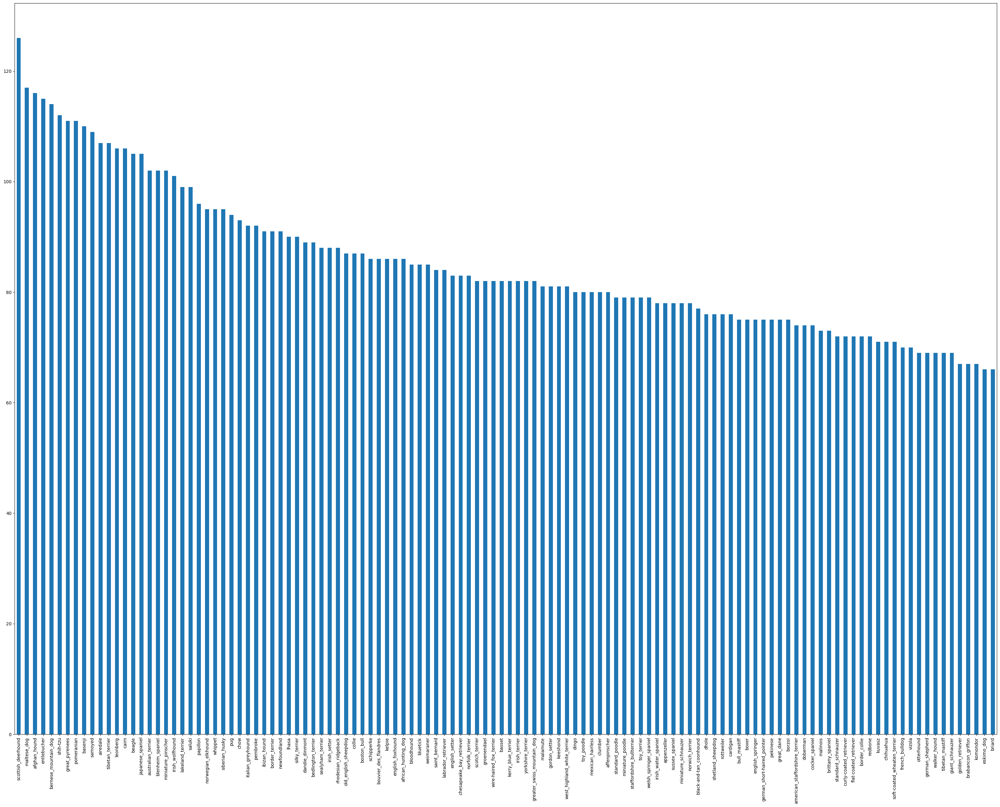

In [16]:
#How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize = (40,30));

In [17]:
labels_csv["breed"].value_counts().median()
#the average images of each label is 82 pictures

82.0

In [18]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


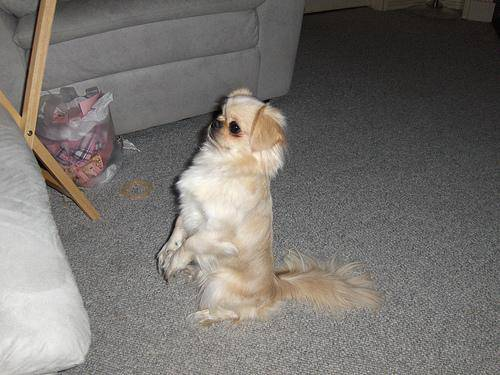

In [19]:
# Let's view an image in this case a pekinese dog
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")



#Getting images and their labels

Let's get a list of all of our image file pathnames.

In [20]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

#Check the first 10
len(filenames)

10222

In [21]:
import os
directory = ("/content/drive/MyDrive/Dog Vision/train/")
file_count = len (os.listdir(directory))
print ("number of files", file_count)

number of files 10222


In [22]:
import os
os.listdir ("/content/drive/MyDrive/Dog Vision/train/")[:10]

['e3aa1999ea72d13102a3810d312b49ba.jpg',
 'dfe45c3b288b8224eb17dbdaf1706496.jpg',
 'e12c6bc13e4ab1de4dd12d21ce74eefe.jpg',
 'dc07c140b26ba8f2c75770f00229270b.jpg',
 'e5fb57e9d1239cd72c7855be2947b0c9.jpg',
 'dcc19db6b4e117d5e4f7d1b00fbe3982.jpg',
 'dd52583a6a9bfdcc5278c5d61a57b7e1.jpg',
 'e65087fe4a5ef4495d30e454f281b06f.jpg',
 'e33ebba7c3621778acdd362e12d35660.jpg',
 'e6b47a2f62d0956fae1f3970f310b64a.jpg']

In [23]:
#check number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train/")) == len(filenames) :
  print("Filenames match actual amount of files! proceed.")
else:
  print("Filenames do not match actual files! Abort.")


Filenames match actual amount of files! proceed.


In [24]:
#extra check
labels_csv["breed"][9000]

'tibetan_mastiff'

## since we've got our training image filepaths in a list, let's prepare our labels.

In [25]:
import numpy as np
labels =labels_csv["breed"]
labels = np.array(labels)
labels[0:]

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [26]:
len(labels)

10222

In [27]:
#See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filesnames!")
else:
  print("Number of labels does not match number of filenames,check data directories!")

Number of labels matches number of filesnames!


In [28]:
#Find unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [29]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [30]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]



[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [31]:
len(boolean_labels)

10222

In [32]:
#Example:turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
no validation set was found so we have to create our own

In [33]:
# Setup x & y variables
x = filenames
y = boolean_labels


In [34]:
len (filenames)

10222

we're going to start off experimenting with - 100 images and increase as they are needed

In [35]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000, max:10000,step:1000}

In [36]:
#let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
np.random.seed(42)
#split them into training data and validation of total size NUM_IMAGES
x_train, x_val , y_train , y_val = train_test_split(x[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state = 42 )
#checking data dimensions

len(x_train) , len(y_train), len (x_val), len (y_val)                                                                 
                                                                

(800, 800, 200, 200)

In [37]:
#checking data
x_train[:5], y_train [:2]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

**Preprocessing Images** (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3.Turn our 'image' (a jpg) into Tensors
4.Normalize our image (convert color channel values from 0-255 to 0-1).
5.Resize the 'image' to be a shape of (224, 224)
6.Return the modified 'image'

In [38]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape
#height, Width , colour

(257, 350, 3)

In [39]:
print(filenames[30])


/content/drive/MyDrive/Dog Vision/train/00ca18751837cd6a22813f8e221f7819.jpg


In [40]:
image.max() , image.min()

(255, 0)

In [41]:
#turn images into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [42]:
#Define image size
IMG_SIZE = 224 

#create a function for preprocessing images
def process_image (image_path,img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  #Read in an image file
  image = tf.io.read_file (image_path)
  # 4. normalize our images in colour and size
  #Turn the jpeg image into numerical Tensor with 3 colour channels (red,green,blue)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to our desired value (224,224)
  image = tf.image.resize(image,size = [IMG_SIZE, IMG_SIZE])

  return image

### Turning our data into batches

MAX size = 32 when preprocesing images



In [43]:
#Function to return a tuple(image,label)
def get_image_label (image_path,label):
  
  image = process_image(image_path)
  return image, label

  "Takes an image file path and label process the image and returns a tuple of (image,label"
  

In [44]:
#test
(process_image(x[42]),tf.constant(y[42]))

#Result ends in correct shape colour and label

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [45]:
#@title
#Turn X and Y into batches of images
BATCH_SIZE = 32

#Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) ###only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  # filepaths
                                                tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("CREATING TRAINING DATA BATCHES...")
    # TURN FILEPATHS AND LABELS INTO TENSORS
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                tf.constant(y)))
    # Shuffling pathanames and labels before mapping image processor function is faster than shuttin
    data = data.shuffle(buffer_size=len(x))
    # Create (image, label) tuples (this also turns the image path into preprocessed image)
    data = data.map(get_image_label)
    # Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch




In [46]:
#Create a traning and validation data batch
train_data = create_data_batches (x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)




CREATING TRAINING DATA BATCHES...
Creating validation data batches...


In [47]:
#Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches let's try and make it more visual for easier analysis

In [48]:
import matplotlib.pyplot as plt
#Create a function for viewing images in data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 ( for displaying 25 images)
  for i in range(25):
    #Create subplots 5 rows, 5 columns
    ax=plt.subplot(5,5, i+1)
    #display an image
    plt.imshow(images[i])
    #add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")





In [49]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

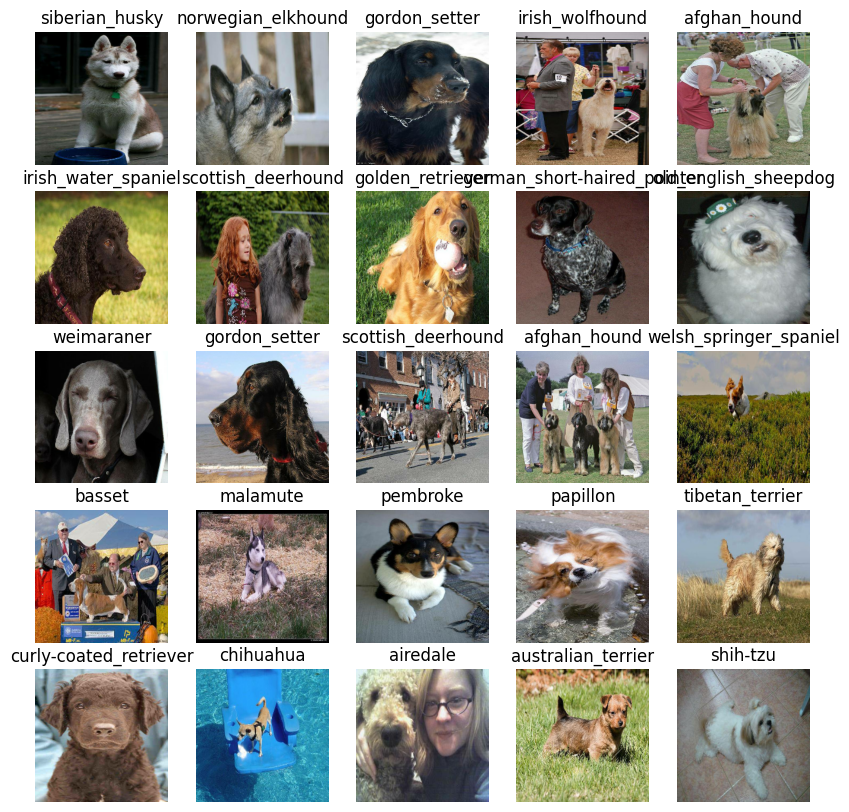

In [50]:
#Train batch visualization
train_images, train_labels = next (train_data.as_numpy_iterator())
show_25_images (train_images,train_labels)

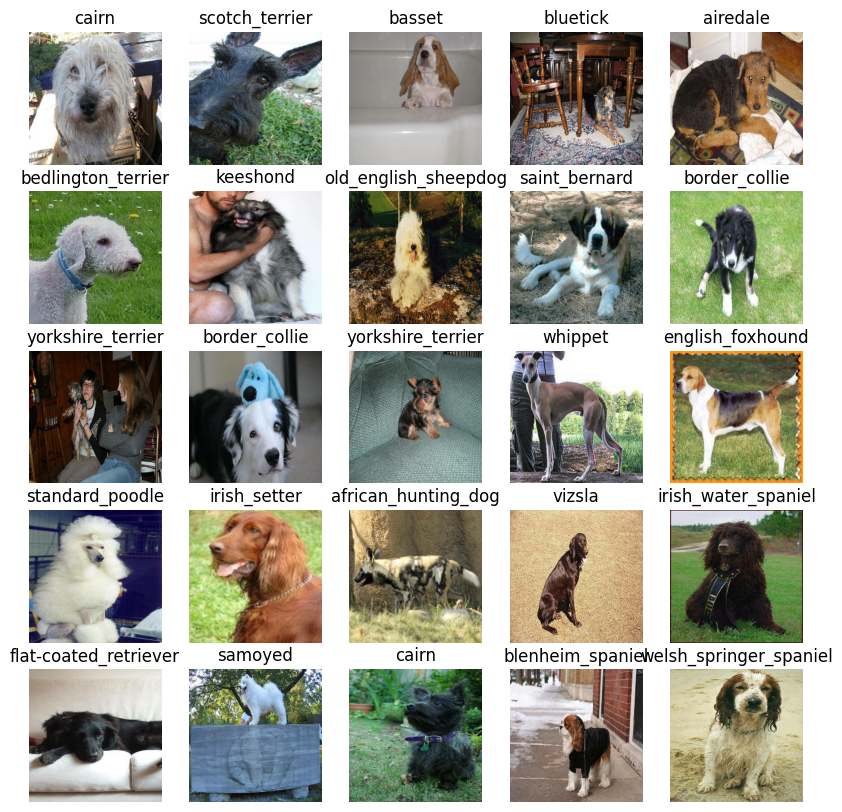

In [51]:
# # Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

#Building the model
Things that need to get defined before making the model:

-the input shape (our images shapre, in the form of Tensors) to our model.

-The output shape (image labels, in the form of Tensors) of our model.

-The URL of the model we want to use is 

In [52]:
#Setting up the input shape of the model
INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE,3] #batch, height, width, colour channels

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#setup model url from Tensorflow hub

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"



###putting togther into a keras deep learning model!

*Input shape,output shape and the model we've chosen as parameters.

*Defines the layers in a keras model in sequential fashion (do this first, then this, then that).

*Compiles the model (says it should be evaluated and improved)

*Builds the model (tells the model the input shape it'll be getting

*Returns the model.

Following the steps of: https://www.tensorflow.org/guide/keras/overview

In [53]:
def create_model (input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:",MODEL_URL)

  #Setup the model layers
  model=tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), #Layer 1 (input later)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax")  #layer 2(output later)


  ])

  #Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
#Build the model
  model.build(INPUT_SHAPE)
  return model



In [54]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callback
KERAS
Functions that will help us during the training of our Model

-We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

##TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:
1.Load the TensorBoard notebook extension
2.Create a TensorBoard callback which is able to save logs to
a directory and pass it to our models "fit()" function.
3.visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [55]:
#Load TensorBoard notebook extension
%load_ext tensorboard

In [56]:
import datetime
#CREATE a function to build a Tensor Board callback
def create_tensorboard_callback():
  #create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog vision/logs",
                        #make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y&m%d-%H%M%S"))
  

  return tf.keras.callbacks.TensorBoard(logdir)



### Early stopping Callback

Feature that will stop our model from overfitting by stopping training if a certain evaluation stops improving.



In [57]:
#Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor ="val_accuracy",
                                                 patience =3 )

##Training a model on a subset of data

Our first model is only going to train on 1000 images, to make sure everything is working.

In [58]:
#@title 
NUM_EPOCHS = 100 #@param {type:"slider", min:10,max:100}


In [59]:
#Check to make sure we're still running on a GPU
print("GPU","available (YES)") if tf.config.list_physical_devices ("GPU") else "not available :"

GPU available (YES)


Let's create a function that trains a model.

*Create a model using "create model()"

*Setup a TensorBoard callback using 'create_tensorboard_callback()'

*Call the fit () function on our model passing it the training data, validation, data number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use

*Return the model


In [60]:
#Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # create a model
  model = create_model()
  # create a new Tensorboard session everytime we train the model
  tensorboard = create_tensorboard_callback()
  
  #fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks= [tensorboard,early_stopping])
  
  return model

In [61]:
#fit the model to the data
model = train_model()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 153s 5s/step - loss: 4.6934 - accuracy: 0.0962 - val_loss: 3.4984 - val_accuracy: 0.2900
Epoch 2/100
25/25 [==============================] - 3s 119ms/step - loss: 1.6819 - accuracy: 0.6875 - val_loss: 2.1886 - val_accuracy: 0.5650
Epoch 3/100
25/25 [==============================] - 5s 194ms/step - loss: 0.5875 - accuracy: 0.9337 - val_loss: 1.6807 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 3s 118ms/step - loss: 0.2643 - accuracy: 0.9800 - val_loss: 1.4972 - val_accuracy: 0.6700
Epoch 5/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1530 - accuracy: 0.9950 - val_loss: 1.4196 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1023 - accuracy: 1.0000 - val_loss: 1.3803 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================]

## NOTE:!warning it looks like our model is overfitting which might be good because it means our model is learning!




In [62]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ vision/logs --port 6007
# port 6007 is not plugging ...

<IPython.core.display.Javascript object>

In [63]:
!ps -aux | grep tensorboard


root        8480 93.0  4.4 8382348 594100 ?      Sl   04:00   0:04 /usr/bin/python3 /usr/local/bin/tensorboard --logdir /content/drive/MyDrive/Dog vision/logs --port 6007
root        8509  0.0  0.0   6904  3308 ?        S    04:00   0:00 /bin/bash -c ps -aux | grep tensorboard
root        8511  0.0  0.0   6444   656 ?        S    04:00   0:00 grep tensorboard


Making and evaluating predictions using a trained model

In [64]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [65]:
#Make a prediction on the validation data
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 3s 92ms/step


array([[8.5790297e-03, 2.9926366e-04, 9.3053101e-04, ..., 2.4718395e-04,
        1.6817663e-04, 1.3885954e-02],
       [2.7895335e-02, 6.0752744e-04, 6.0082818e-03, ..., 3.8129932e-04,
        2.0348020e-03, 1.2738888e-04],
       [1.6979606e-05, 7.4897462e-04, 5.4724551e-05, ..., 1.0834634e-04,
        2.4833753e-05, 1.8407710e-04],
       ...,
       [5.4598581e-06, 1.6616157e-04, 3.1388976e-05, ..., 6.2414372e-05,
        9.9581732e-05, 6.0478913e-05],
       [4.8023104e-03, 1.6401095e-04, 1.4584196e-04, ..., 1.3684665e-04,
        2.1437572e-04, 6.8421764e-03],
       [8.1138877e-04, 1.8915473e-05, 2.0298000e-02, ..., 7.6940628e-03,
        1.8059895e-03, 3.5093690e-05]], dtype=float32)

In [66]:
# first prediction 
index = 42
print(predictions[index])
print(f"Max Value(probability of prediction): {np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.96157605e-04 3.68612789e-04 3.90327587e-05 2.35388561e-05
 3.82855372e-03 9.05274064e-05 2.62708141e-04 1.25433155e-03
 1.26501070e-02 2.35627163e-02 3.70501184e-05 1.70873955e-05
 3.87343956e-04 8.12917762e-03 5.43238828e-04 5.30798687e-03
 2.14212239e-04 1.31430250e-04 2.04014432e-04 9.86769446e-05
 4.40232870e-05 1.68752696e-04 6.00572348e-05 2.33966493e-05
 1.46377292e-02 1.51103581e-04 6.77575517e-05 2.92670476e-04
 5.28149481e-04 2.41106623e-04 1.74056360e-04 8.74038451e-05
 8.34649036e-05 2.72274101e-05 1.16199590e-04 9.19631784e-05
 6.93948168e-05 3.57009878e-04 6.82192040e-05 2.04109222e-01
 5.03527292e-04 3.45271947e-05 2.82661244e-03 1.11723703e-05
 1.12158887e-04 2.19609021e-04 2.72325939e-04 4.41818527e-04
 3.90217792e-05 2.78952299e-04 6.16536636e-05 9.12229007e-05
 3.03131383e-04 3.05901887e-03 1.30308123e-04 1.29460881e-04
 3.46608285e-04 1.28375032e-04 3.50595830e-04 1.04696439e-04
 1.07597494e-04 5.28419972e-04 5.37743072e-05 1.95942222e-04
 4.18360396e-05 2.472882

In [67]:
#prediction probablity

In [68]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
 """
  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[1])
pred_label

'scotch_terrier'

In [69]:
#Create a function to unbatch a batch dataset
def unbatch (data):
  """
  Takes a batched dataset of (image,label) Tensors and returns resparate arrays of images and labels.
  """
  images = []
  labels = []

  #loop thorugh unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

 #unbatch the validation data
val_images, val_labels = unbatch(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Features until now:

*   Prediction labels ✅
*   Validation labels (truth labels) ✅
*   Validation images ✅

Let's make some functions to make these more visual.

*Creation of a function that takes an array of predictions probabilities, an array of truth labels and an array of images and integers.✅

*Conver the prediction probabilities to a predicted label.✅

*Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.✅








In [70]:
def plot_pred(prediction_probabilities,labels,images, n = 1) :
  """
  View the prediction and image for a sample from n
  """
  pred_prob, true_label, image =prediction_probabilities [n],labels[n],images[n]

 #Get the pred label
  pred_label = get_pred_label (pred_prob)

 #plot image & remove ticks
  plt.imshow (image)
  plt.xticks([])
  plt.yticks([])

#change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else: 
    color = "red"
#Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format (pred_label,
                                  np.max(pred_prob)*100,
                                  true_label),
                                  color=color)


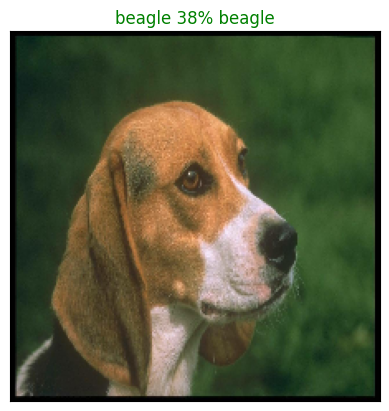

In [71]:
plot_pred (prediction_probabilities = predictions,
          labels=val_labels,
          images=val_images,
           n = 120)

Now we've got one function to visualize our models predictions, let's make another to view our models top 10 predictions.
This function will: 

*Take an input of prediciton probabilities array and a ground truth array and an integer

*find the prediction using get_pred_label()

*Find the Best 10:
  *Prediction probabilities✅
  
  *prediction probabilities values ✅

  *Prediction labels ✅

  *plot the top 10 prediction probability values and labels, coloring the true label green. ✅

In [72]:
 def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n],labels[n]

  #get predicted label

  pred_label= get_pred_label(pred_prob)

  #find the top 10 predictions confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  #setup plot
  top_plot = plt.bar (np.arange(len(top_10_pred_labels)),
                                top_10_pred_values,
                                color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation ="vertical")
  
  #change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")


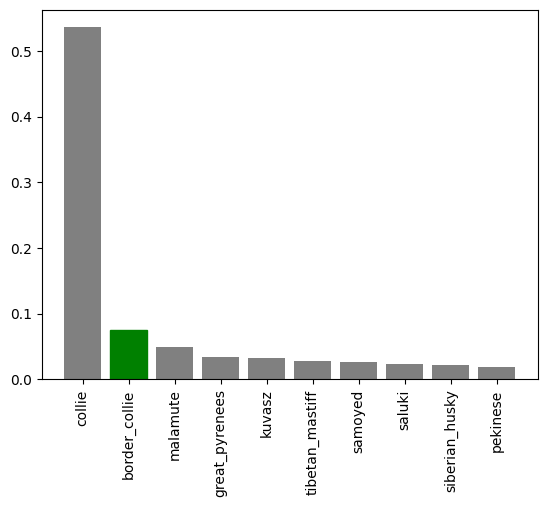

In [73]:
#Helps us predict on the evaluation which label it would have predicted confidently
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

#

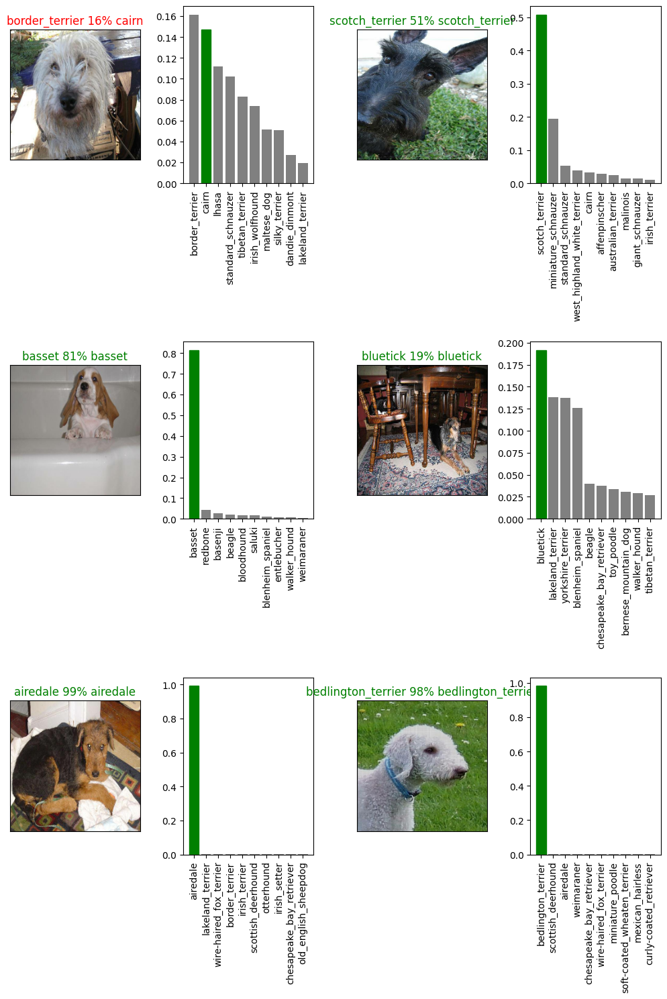

In [74]:
# predictions and their different values
i_multiplier= 0 
num_rows = 3 
num_cols = 2 
num_images = num_rows*num_cols
plt.figure(figsize=(5*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
          n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=2.0)
plt.show();

#Confusion Matrix to measure where our machine learning model is failing


# Saving and reloading machine learning model


In [75]:
# create a fucntion to save a model
def save_model (model, suffix=None):
 """
 Saves a given model in a models directory and append a suffix (string).
 """
 #create a model directory pathname with current time
 modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
 model_path = modeldir +"_" + suffix + ".h5" #save format of model
 print(f"saving model to:{model_path}...")
 model.save(model_path)
 return model_path

In [76]:
#Create a function to load a trained model
def load_model (model_path):
  """
  Loads a saved model from a specified path.
  """
  print (f"Loading saved model from:{model_path}")
  model= tf.keras.models.load_model(model_path,
                                  custom_objects={"KerasLayer":hub.KerasLayer})
  
  return model

Now we've got functions to save and load a trained model,let's make sure they work!

In [77]:
#Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

saving model to:drive/My Drive/Dog Vision/models/20230525-04001684987238_1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20230525-04001684987238_1000-images-mobilenetv2-Adam.h5'

In [78]:
#load a trained model"
loaded_1000_image_model = load_model ("drive/My Drive/Dog Vision/models/230523-02261684808799_1000-images-mobilenetv2-Adam.h5")

Loading saved model from:drive/My Drive/Dog Vision/models/230523-02261684808799_1000-images-mobilenetv2-Adam.h5


In [79]:
#evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 127ms/step - loss: 1.3006 - accuracy: 0.6800


[1.300626277923584, 0.6800000071525574]

In [80]:
# evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)


7/7 [==============================] - 2s 148ms/step - loss: 1.3142 - accuracy: 0.6250


[1.3141636848449707, 0.625]

Training a model in full data set

In [81]:
#filenames,labels
len(x), len(y)

(10222, 10222)

In [82]:
#Create a data batch with the full data set
full_data = create_data_batches(x,y)

CREATING TRAINING DATA BATCHES...


In [83]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [84]:
#Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [85]:
#Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
#no validation set when training on all the data, so we can't minotor our validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping (monitor="accuracy",
                                                              patience =3)

**NOTE** !WARNING the cell below will take on average more than 30 less than 60 minutes on runtime has to load all of the images into memory.

In [86]:
#Fit the full model to the full data
full_model.fit(x = full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 37s 104ms/step - loss: 1.3568 - accuracy: 0.6628
Epoch 2/100
320/320 [==============================] - 33s 103ms/step - loss: 0.4012 - accuracy: 0.8810
Epoch 3/100
320/320 [==============================] - 34s 105ms/step - loss: 0.2368 - accuracy: 0.9353
Epoch 4/100
320/320 [==============================] - 37s 117ms/step - loss: 0.1552 - accuracy: 0.9621
Epoch 5/100
320/320 [==============================] - 36s 112ms/step - loss: 0.1077 - accuracy: 0.9776
Epoch 6/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0784 - accuracy: 0.9863
Epoch 7/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0590 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0459 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0367 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 35s 108m

In [87]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

saving model to:drive/My Drive/Dog Vision/models/20230525-04111684987867_full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20230525-04111684987867_full-image-set-mobilenetv2-Adam.h5'

In [88]:
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20230524-01501684893042_full-image-set-mobilenetv2-Adam.h5')

Loading saved model from:drive/My Drive/Dog Vision/models/20230524-01501684893042_full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll
have to get it into the same format.

Thanks to 'Create_data_batches()' earlier which can take a list of filenames as input and cover them into Tensor batches.

To make predictions on the test data, we'll:

*Get the test image filenames

*Convert the filenames into test data batches using
'Create_data_batches' and setting the 'test_data'
parameter to 'True'(Since the test data doesn't have labels).

*Make a predictions array by passing the test batches to 'predict()' method called on our model

In [89]:
#Load test image filenames
import os

test_path = "/content/drive/MyDrive/Dog Vision/test"
test_filenames = [os.path.join(test_path, fname) for fname in os.listdir(test_path)]
test_filenames[:10]


['/content/drive/MyDrive/Dog Vision/test/e42e9ceb31ec428968e88b556a92e858.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dd98d4023806fdee7721b42db812f131.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e55fa0c818f485f8e36edfb464c4f129.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e2f94ad185a2cfa2311c66c3e8bdba17.jpg',
 '/content/drive/MyDrive/Dog Vision/test/df577444ba8b7733f42c49e9d42111a9.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e66eb9532985301394e1bfb8f05206d4.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e3dd8fc9162f726122ca4cc783114c81.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e37be38e73463da5a0d9f3e33263d287.jpg']

In [90]:
#create test data batch
test_data = create_data_batches(test_filenames, test_data =True)

Creating test data batches....


In [91]:
# Create test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches....


In [92]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Note: calling predict() on our full model and passing it the test data batch will take a long time to run about 1 hour

In [93]:
#Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict (test_data,verbose=1)
                                                

   


324/324 [==============================] - 187s 566ms/step


In [94]:
#save predictions (Numpy array) to csv file (for access later
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

##preds array checkpoint

In [95]:
 #load predictions
 import numpy as np
 test_predictions =np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv",delimiter="," )

In [96]:
test_predictions[:10]

array([[2.98605862e-11, 6.36256195e-12, 2.59386748e-11, ...,
        3.62635092e-06, 2.29414672e-14, 8.93385713e-11],
       [2.27653183e-13, 2.71062524e-13, 5.26262523e-16, ...,
        2.47980109e-10, 5.23587562e-11, 2.74973979e-15],
       [2.37837252e-08, 2.01016775e-13, 9.47492605e-12, ...,
        4.94449794e-12, 1.09979222e-11, 1.20662946e-09],
       ...,
       [5.99450073e-11, 8.07771818e-12, 4.13539158e-09, ...,
        1.30089713e-04, 3.83322929e-09, 1.06872413e-08],
       [8.81502160e-09, 5.82418974e-11, 3.96345075e-11, ...,
        5.88798841e-08, 2.58304472e-11, 1.86878360e-11],
       [1.39847856e-07, 4.97982766e-10, 6.70399913e-08, ...,
        3.77274767e-10, 1.18659438e-04, 9.29542601e-01]])

In [97]:
test_predictions.shape

(10343, 120)

##To get the data in this format, we'll:
Create a pandas Dataframe with an ID column as well as a column for each dog breed
to get the data in this format, we'll:

*   Create a pandas Dataframe with an ID column as well as a column for each dog breed   
*   Add data to the Id column by extracting the test image ID' from their filepaths
*   Add data (the predictions probabilites) to eac of the dog breed columns.
*   Export the DataFrame as a CSV to submit it to kaggle.




In [98]:
#["id"]+list(unique_breeds)

In [99]:
#Create a DataFrame with empty columns
import pandas as pd
preds_df= pd.DataFrame(columns=["id"]+ list (unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [100]:
# Append test image ID's to predictions Dataframe
test_ids = [os.path.splitext(path)[0]for path in os.listdir(test_path)]
preds_df["id"]= test_ids

In [101]:
os.path.splitext(test_filenames[0])

('/content/drive/MyDrive/Dog Vision/test/e42e9ceb31ec428968e88b556a92e858',
 '.jpg')

In [102]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e42e9ceb31ec428968e88b556a92e858,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dd98d4023806fdee7721b42db812f131,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7b608110b0e29120d8740f37e85f3d0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7dc8cc599049ea9fa2a172c88646c57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e55fa0c818f485f8e36edfb464c4f129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [124]:
#Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e42e9ceb31ec428968e88b556a92e858,2.986059e-11,6.362562e-12,2.593867e-11,2.324727e-09,1.258461e-04,4.122955e-07,4.064573e-09,6.516497e-10,2.392690e-10,...,3.241594e-08,3.889312e-08,2.843126e-05,1.897342e-10,5.667779e-04,6.086515e-12,1.791620e-12,3.626351e-06,2.294147e-14,8.933857e-11
1,dd98d4023806fdee7721b42db812f131,2.276532e-13,2.710625e-13,5.262625e-16,2.332786e-13,2.273101e-08,9.848354e-09,1.336080e-09,9.999974e-01,9.715362e-10,...,5.447789e-09,2.548736e-11,3.330233e-11,1.439589e-12,2.660632e-13,8.419213e-13,3.414324e-14,2.479801e-10,5.235876e-11,2.749740e-15
2,e7b608110b0e29120d8740f37e85f3d0,2.378373e-08,2.010168e-13,9.474926e-12,1.043342e-11,1.561598e-10,3.542691e-11,1.801986e-12,8.955175e-12,3.956808e-13,...,8.516433e-12,1.391122e-10,4.963472e-12,2.477850e-10,1.318388e-10,1.299657e-11,2.149837e-11,4.944498e-12,1.099792e-11,1.206629e-09
3,e7dc8cc599049ea9fa2a172c88646c57,1.461906e-07,1.720574e-09,1.871352e-09,1.918343e-11,8.316725e-08,1.000219e-09,2.912032e-10,6.692817e-10,4.901377e-12,...,1.556101e-08,8.204596e-09,1.780731e-10,9.838192e-09,3.386637e-09,6.155078e-10,1.068640e-07,1.493209e-11,4.108165e-07,1.121819e-07
4,e55fa0c818f485f8e36edfb464c4f129,6.485157e-10,7.348236e-11,6.786376e-13,4.654231e-10,1.618858e-06,1.970197e-08,2.015058e-08,1.747884e-11,2.293598e-14,...,9.336970e-10,2.044223e-07,2.863672e-10,7.206191e-11,2.547714e-12,4.807268e-10,3.971347e-12,7.822808e-12,5.579234e-09,1.276658e-06


In [104]:
#Saving our predictions dataframe to CSV 
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_mobilenetV2.csv",index=False)

## Making our predictions on images outside the folder

To make predictions on custom images, we'll:

* Get the filepaths of our own images
* Turn the filepaths into data batches using create_data_batches () . And since our custom igmaes won't have labels, we set the test_data parameter to True
* Pass the custom image data batch on a custom folder predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.\

In [126]:
custom_path = "drive/My Drive/Dog Vision/Custom-Dogs/"
absolute_custom_path = os.path.abspath(custom_path)
custom_image_paths = [os.path.join(absolute_custom_path, fname) for fname in os.listdir(absolute_custom_path)]

# Rest of your code...





In [127]:
custom_image_paths

['/content/drive/My Drive/Dog Vision/Custom-Dogs/86992fae-09a7-406f-8780-48345905e337.jpeg',
 '/content/drive/My Drive/Dog Vision/Custom-Dogs/c3e79e99-fa6e-4647-acc4-bf7f7431f9dd.jpeg',
 '/content/drive/My Drive/Dog Vision/Custom-Dogs/6b2982b7-1403-484a-9710-33191ba90f58.jpeg',
 '/content/drive/My Drive/Dog Vision/Custom-Dogs/940b2b6e-3a08-4c9c-ad4f-ef67b654f1af.jpeg',
 '/content/drive/My Drive/Dog Vision/Custom-Dogs/340812728_1693855481077667_4655828841934636669_n.jpeg',
 '/content/drive/My Drive/Dog Vision/Custom-Dogs/346145043_984848756133609_7401599508008170283_n.jpeg',
 '/content/drive/My Drive/Dog Vision/Custom-Dogs/0d5e586e-9cd8-47f7-9867-157ca02f7a5a.jpeg',
 '/content/drive/My Drive/Dog Vision/Custom-Dogs/346147268_991712198651448_1544692317109622913_n.jpeg',
 '/content/drive/My Drive/Dog Vision/Custom-Dogs/45760903-9814405-image-a-1_1626956924569.jpeg']

In [128]:
#turn custom images into batch datasets
custom_data = create_data_batches ( custom_image_paths,test_data=True)
custom_data

Creating test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [129]:
#make a prediction on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [130]:
custom_preds.shape 

(9, 120)

In [134]:
#get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels


['american_staffordshire_terrier',
 'whippet',
 'italian_greyhound',
 'american_staffordshire_terrier',
 'bull_mastiff',
 'pug',
 'great_dane',
 'redbone',
 'groenendael']

In [137]:
#get the custom images (our unbatch() function won't work since there aren't labels..)
custom_labels = []
custom_images = []  # create an empty list to store the custom images

# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)  # append each image to the custom_images list


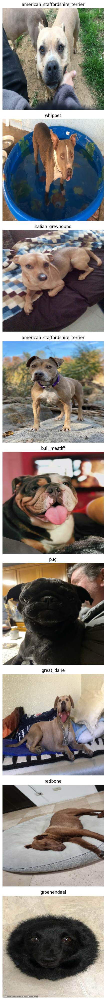

In [155]:
import numpy as np
import matplotlib.pyplot as plt

# check custom image predictions
num_images = len(custom_images)
fig, axes = plt.subplots(num_images, 1, figsize=(20, 40))

for i, (image, label) in enumerate(zip(custom_images, custom_pred_labels)):
    image = np.squeeze(image)  # remove the extra dimension
    axes[i].imshow(image)
    axes[i].set_title(label)
    axes[i].axis('off')

plt.tight_layout()
plt.show()


